In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
checkpoint_path ="/content/drive/MyDrive/checkpoint.pth"

In [ ]:
import torch

# Load the model from the checkpoint file
model = torch.load("/content/drive/MyDrive/checkpoint.pth")

# Set the model to evaluation mode
model.eval()


<ipython-input-1-8a980fe04a9a>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("/content/drive/MyDrive/checkpoint.pth")


AttributeError: 'dict' object has no attribute 'eval'

In [ ]:
!git clone https://github.com/facebookresearch/dino


Cloning into 'dino'...
remote: Enumerating objects: 175, done.
remote: Total 175 (delta 0), reused 0 (delta 0), pack-reused 175 (from 1)
Receiving objects: 100% (175/175), 24.47 MiB | 34.09 MiB/s, done.
Resolving deltas: 100% (100/100), done.


In [ ]:
import torch
import sys

# Add DINO repository to the Python path (if you cloned it)
sys.path.append("/content/dino")  # Adjust the path if necessary

# Import the DINO model architecture from the provided script
from vision_transformer import vit_tiny  # This comes from the DINO repo

# Step 1: Define the model architecture (based on what you used for training)
model = vit_tiny(patch_size=16)  # Or vit_small/vit_base depending on what you used

# Step 2: Load the checkpoint
checkpoint_path = "/content/drive/MyDrive/checkpoint.pth"
checkpoint = torch.load(checkpoint_path)

# Step 3: Load the model's state_dict from the checkpoint
model.load_state_dict(checkpoint['model'], strict=False)

# Step 4: Set the model to evaluation mode
model.eval()

print("DINO model loaded and ready for embedding extraction!")


<ipython-input-8-8068c52b6e97>:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


RuntimeError: Attempting to deserialize object on a CUDA device but torch.cuda.is_available() is False. If you are running on a CPU-only machine, please use torch.load with map_location=torch.device('cpu') to map your storages to the CPU.

In [ ]:
# Load the checkpoint
checkpoint = torch.load(checkpoint_path)

# Print the keys of the checkpoint to understand its structure
print(checkpoint.keys())


<ipython-input-8-5801b7b98401>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


dict_keys(['student', 'teacher', 'optimizer', 'epoch', 'args', 'dino_loss'])


In [ ]:
import torch

# Load the checkpoint
checkpoint = torch.load(checkpoint_path)

# Assuming the 'student' model is what you want
model.load_state_dict(checkpoint['student'], strict=False)

# Set the model to evaluation mode
model.eval()

print("Model loaded and ready for inference!")


<ipython-input-9-aec0842319c0>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Model loaded and ready for inference!


Model loaded and ready for inference! confirms that the model is now in evaluation mode and has the weights from the student model.

In [ ]:
import zipfile
import os

# Replace 'Lung and colon cancer histopathological images.zip' with the actual path to your zip file in Google Drive
zip_path = '/content/drive/MyDrive/Lung and colon cancer histopathological images.zip'

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/Lung and colon cancer histopathological images')  # Specify the extraction folder

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import os

# Define the image transformation (same as used during training)
transform = transforms.Compose([
    transforms.Resize(224),  # Resize to 224x224 as done during training
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Same normalization as during training
])

# Path to your image folder
img_folder = '/content/Lung and colon cancer histopathological images'

# Create a list to store embeddings
embeddings = []

# Loop through the images and process them
for filename in os.listdir(img_folder):
    if filename.endswith(".jpg"):
        img_path = os.path.join(img_folder, filename)

        # Open and preprocess the image
        image = Image.open(img_path)
        image = transform(image).unsqueeze(0)  # Add batch dimension

        # Move image to device (GPU or CPU)
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        image = image.to(device)
        model.to(device)

        # Get the embedding from the model
        with torch.no_grad():
            embedding = model(image)

        # Store the embedding (you may want to store it as a numpy array or tensor)
        embeddings.append(embedding.cpu().numpy())  # If you need the embeddings as numpy arrays

# Optionally, save embeddings for later use
# embeddings = np.array(embeddings)
# np.save('embeddings.npy', embeddings)

print("Embeddings extracted for all images.")


FileNotFoundError: [Errno 2] No such file or directory: '/content/Lung and colon cancer histopathological images'

Now, we have the embeddings stored in the embeddings list.

In [ ]:
print("Shape of one embedding:", embeddings[0].shape)


IndexError: list index out of range

In [ ]:
image = Image.open('/content/Lung and colon cancer histopathological images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg')
image.show()  # This will display the image


In [ ]:
image_path = '/content/Lung and colon cancer histopathological images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg'
print("Image path:", image_path)


Image path: /content/Lung and colon cancer histopathological images/lung_colon_image_set/colon_image_sets/colon_aca/colonca1.jpeg


In [ ]:
import os
if os.path.exists(image_path):
    print("File exists!")
else:
    print("File does not exist!")


File exists!


In [ ]:
import cv2

# Try reading the image with OpenCV
image = cv2.imread(image_path)

if image is not None:
    print("Image loaded successfully with OpenCV")
    # Convert the image from BGR to RGB (OpenCV loads images in BGR format)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_pil = Image.fromarray(image)  # Convert to PIL Image for further processing
    image_pil.show()
else:
    print("Failed to load image with OpenCV")


Image loaded successfully with OpenCV


In [ ]:
import torch
import os
import cv2
from PIL import Image
from torchvision import transforms

# Define the image transformation (same as used during training)
transform = transforms.Compose([
    transforms.Resize(224),  # Resize to 224x224 as done during training
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Same normalization as during training
])

# Path to your image folder
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'

# List to store embeddings
embeddings = []

# Loop through the images in the folder
for filename in os.listdir(img_folder):
    if filename.endswith(".jpeg"):  # Adjusted to look for .jpeg files
        img_path = os.path.join(img_folder, filename)

        # Load the image with OpenCV
        image = cv2.imread(img_path)

        if image is not None:
            # Convert from BGR to RGB
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Convert to PIL Image
            image_pil = Image.fromarray(image)

            # Apply transformations
            image_tensor = transform(image_pil).unsqueeze(0)  # Add batch dimension

            # Move the image to the appropriate device (GPU or CPU)
            device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
            image_tensor = image_tensor.to(device)

            # Get the embedding from the model
            model.to(device)  # Ensure model is on the same device as the image
            with torch.no_grad():
                embedding = model(image_tensor)

            # Store the embedding (as numpy array or tensor)
            embeddings.append(embedding.cpu().numpy())  # Convert to numpy array if needed

# Optionally, save the embeddings to a file
# embeddings = np.array(embeddings)
# np.save('embeddings.npy', embeddings)

print(f"Embeddings extracted for {len(embeddings)} images.")


Embeddings extracted for 0 images.


In [ ]:
import torch
import os
import cv2
from PIL import Image
from torchvision import transforms

# Define the image transformation (same as used during training)
transform = transforms.Compose([
    transforms.Resize(224),  # Resize to 224x224 as done during training
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Same normalization as during training
])

# Path to your image folder
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'

# List to store embeddings
embeddings = []

# Walk through all directories and subdirectories
for root, dirs, files in os.walk(img_folder):
    for filename in files:
        if filename.endswith(".jpeg"):  # Check for .jpeg images
            img_path = os.path.join(root, filename)

            # Load the image with OpenCV
            image = cv2.imread(img_path)

            if image is not None:
                # Convert from BGR to RGB
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

                # Convert to PIL Image
                image_pil = Image.fromarray(image)

                # Apply transformations
                image_tensor = transform(image_pil).unsqueeze(0)  # Add batch dimension

                # Move the image to the appropriate device (GPU or CPU)
                device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
                image_tensor = image_tensor.to(device)

                # Get the embedding from the model
                model.to(device)  # Ensure model is on the same device as the image
                with torch.no_grad():
                    embedding = model(image_tensor)

                # Store the embedding (as numpy array or tensor)
                embeddings.append(embedding.cpu().numpy())  # Convert to numpy array if needed

# Optionally, save the embeddings to a file
# embeddings = np.array(embeddings)
# np.save('embeddings.npy', embeddings)

print(f"Embeddings extracted for {len(embeddings)} images.")


Embeddings extracted for 25000 images.


In [ ]:
import numpy as np

# Convert embeddings list to a numpy array
embeddings_array = np.array(embeddings)

# Save to a file
np.save('embeddings.npy', embeddings_array)
print("Embeddings saved successfully.")


Embeddings saved successfully.


In [ ]:
from google.colab import files
files.download('embeddings.npy')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import numpy as np

# Load the saved embeddings from the .npy file
embeddings = np.load('embeddings.npy')

# Check the shape of the embeddings
print(embeddings.shape)  # (25000, embedding_size)


(25000, 1, 192)


In [ ]:
# Remove the extra batch dimension
embeddings = np.squeeze(embeddings)

# Check the new shape
print(embeddings.shape)  # (25000, 192)


(25000, 192)


In [ ]:
from sklearn.cluster import KMeans

# Assume embeddings is a numpy array of shape (25000, 192)
kmeans = KMeans(n_clusters=5)  # Set the number of clusters (e.g., 5)
clusters = kmeans.fit_predict(embeddings)

# clusters will contain the cluster label for each image
print(clusters)


[2 2 2 ... 2 4 0]


In [ ]:
import numpy as np

# Count the number of images in each cluster
unique, counts = np.unique(clusters, return_counts=True)
cluster_sizes = dict(zip(unique, counts))

print(cluster_sizes)


{0: 3568, 1: 2444, 2: 10374, 3: 4684, 4: 3930}


Cluster 0 contains 3568 images.


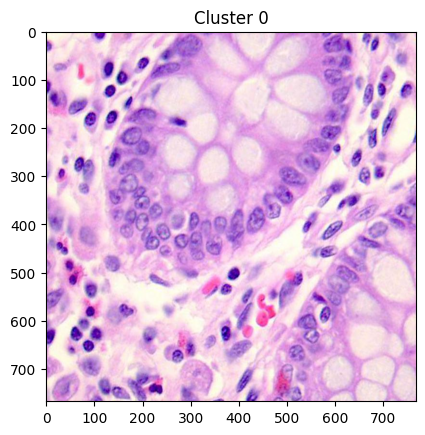

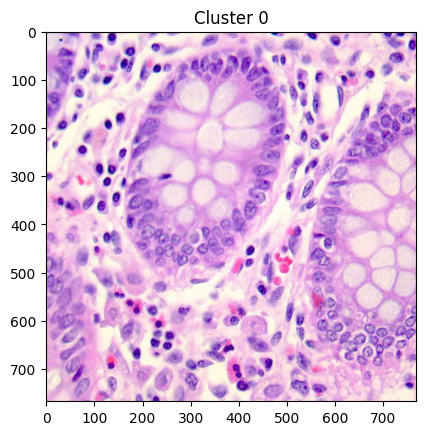

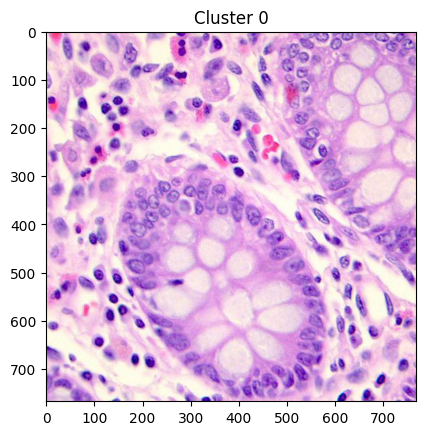

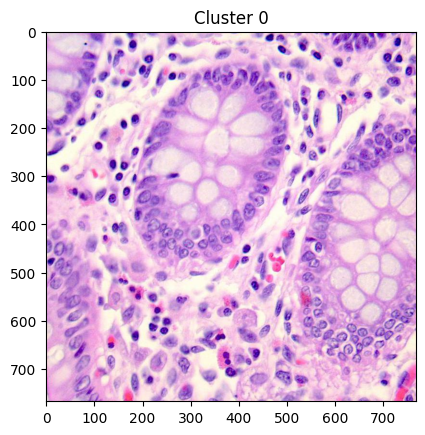

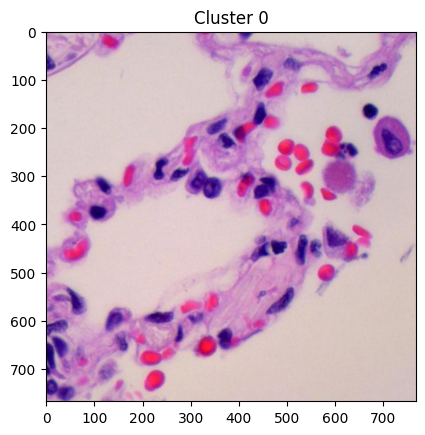

Cluster 1 contains 2444 images.


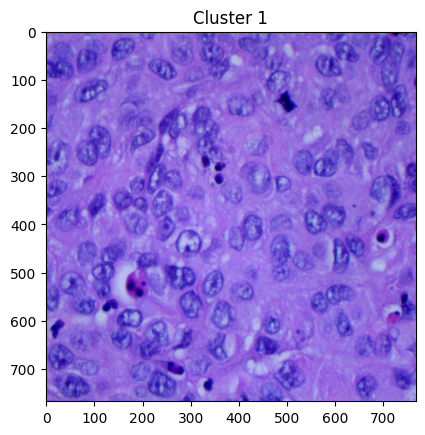

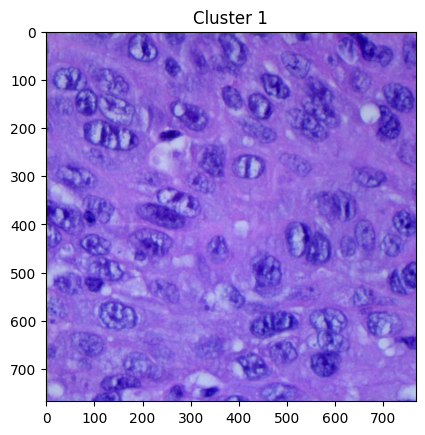

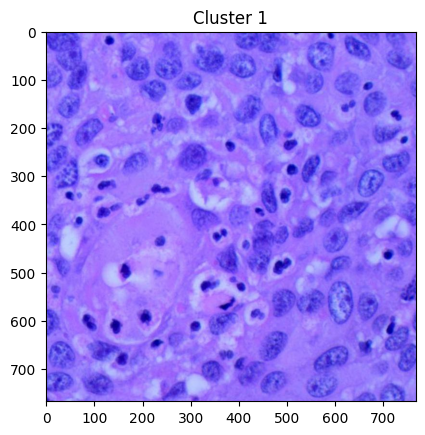

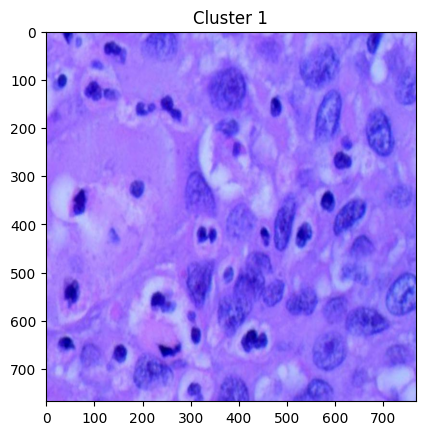

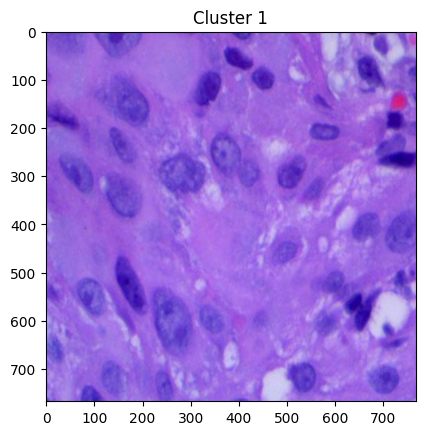

Cluster 2 contains 10374 images.


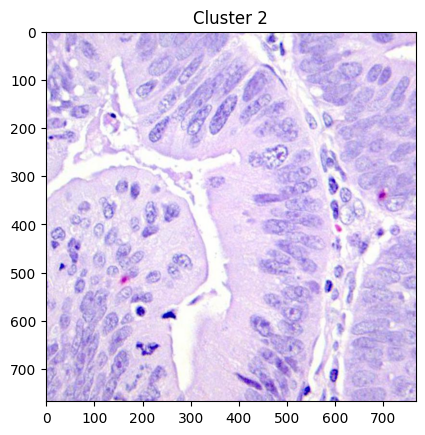

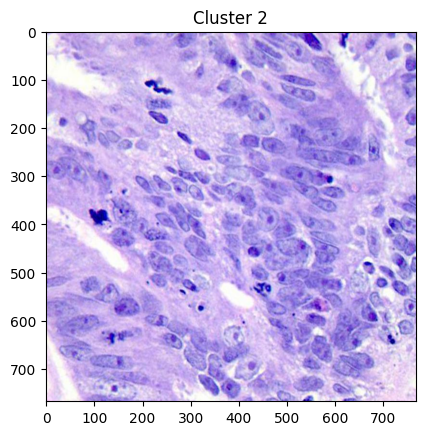

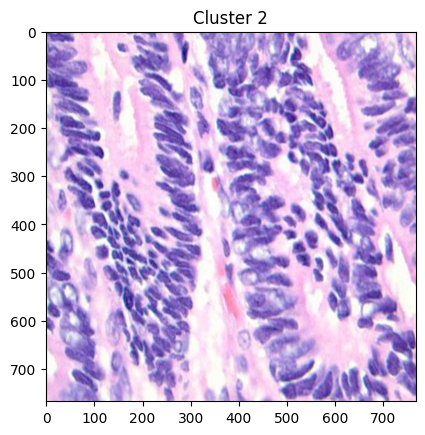

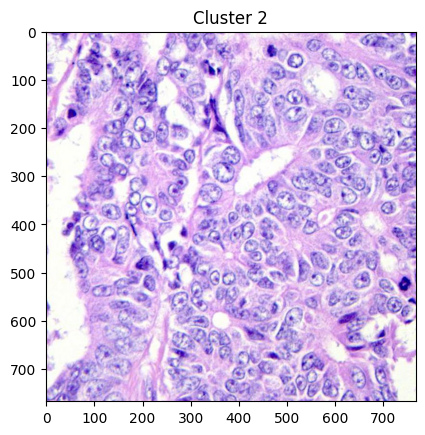

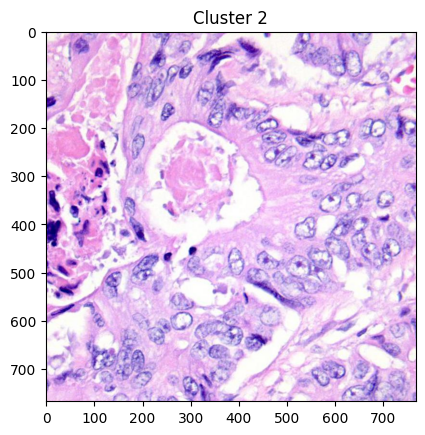

Cluster 3 contains 4684 images.


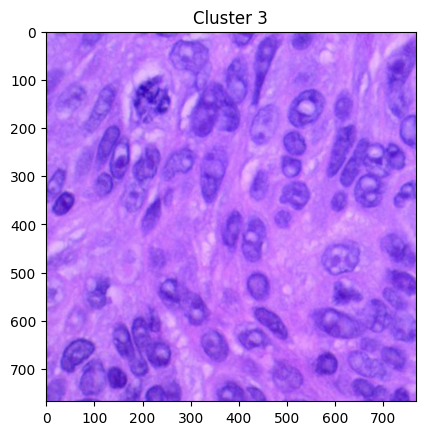

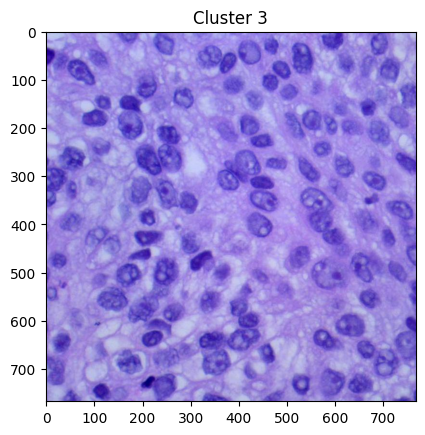

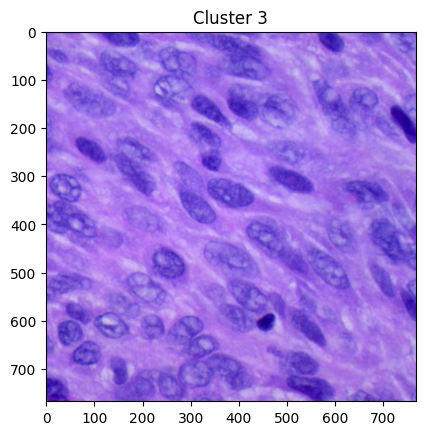

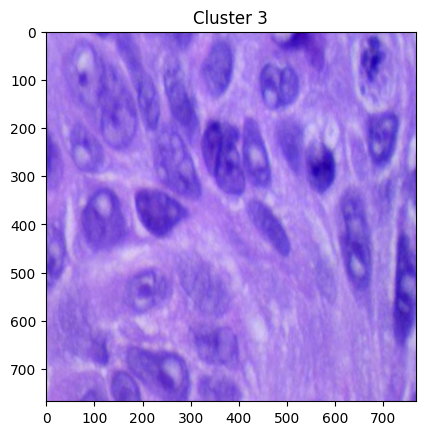

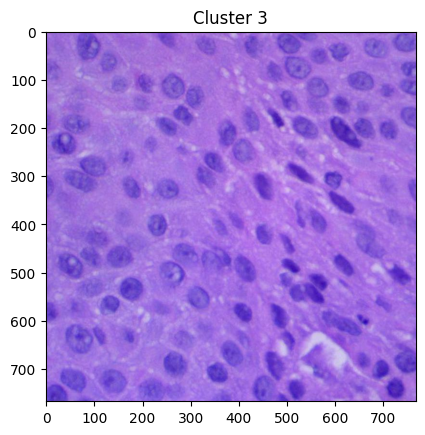

Cluster 4 contains 3930 images.


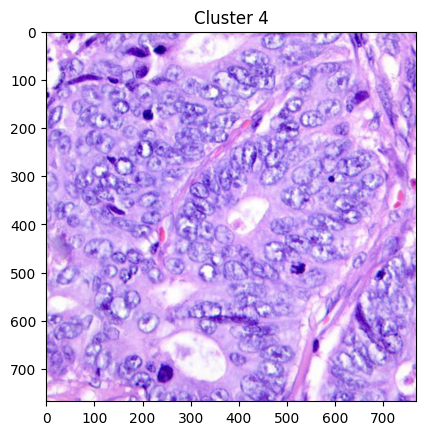

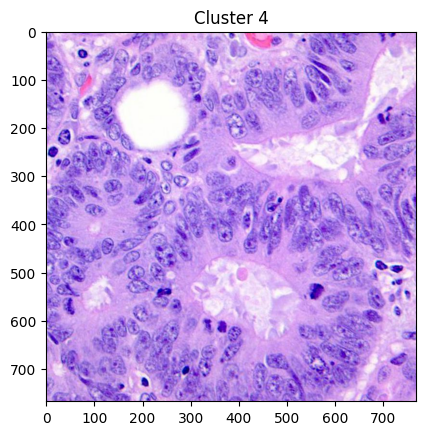

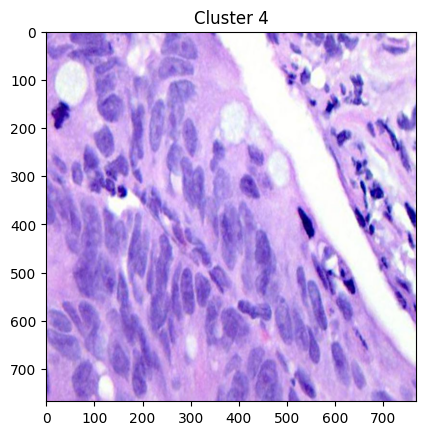

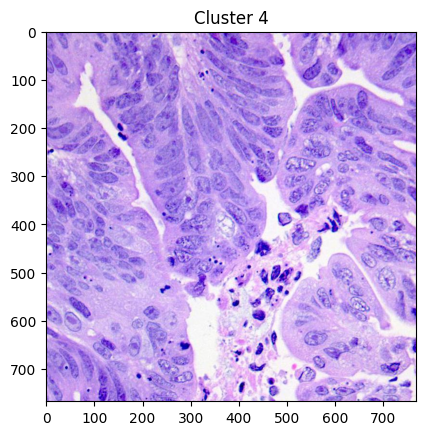

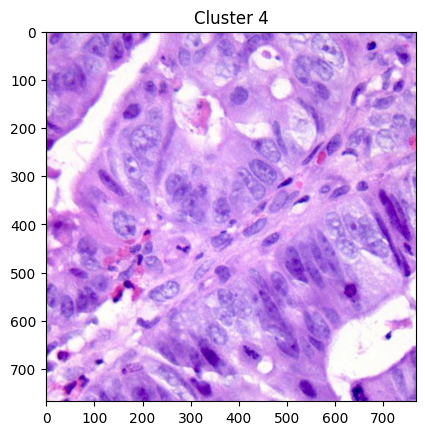

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Define the path to your image folder
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'

# Create a list to store all image paths
all_image_paths = []

# Traverse through the subdirectories and collect image file paths
for root, dirs, files in os.walk(img_folder):
    for file in files:
        if file.endswith(('.jpg', '.jpeg')):  # You can adjust the file types
            all_image_paths.append(os.path.join(root, file))

# Example: Display 5 images from cluster 0, 1, 2, etc.
for cluster_number in range(5):  # Number of clusters you have
    cluster_indices = np.where(clusters == cluster_number)[0]
    print(f"Cluster {cluster_number} contains {len(cluster_indices)} images.")

    for i in range(min(5, len(cluster_indices))):  # Display first 5 images or as many as in the cluster
        # Use cluster indices to get the image path
        img_path = all_image_paths[cluster_indices[i]]  # Get the image path using cluster indices
        img = Image.open(img_path)

        # Display the image
        plt.imshow(img)
        plt.title(f"Cluster {cluster_number}")
        plt.show()


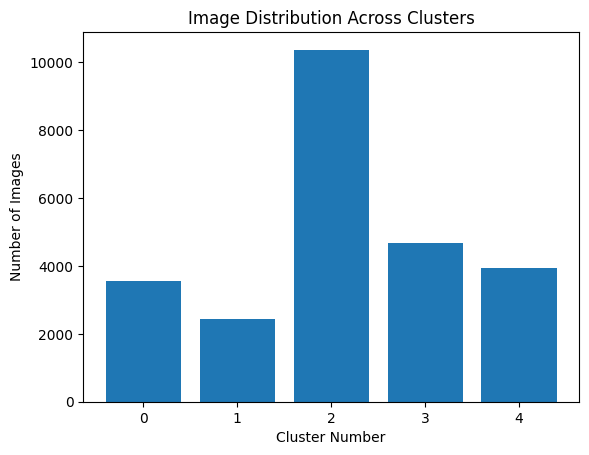

In [ ]:
import matplotlib.pyplot as plt

# Plot the distribution of images across clusters
cluster_labels, cluster_counts = zip(*cluster_sizes.items())
plt.bar(cluster_labels, cluster_counts)
plt.xlabel('Cluster Number')
plt.ylabel('Number of Images')
plt.title('Image Distribution Across Clusters')
plt.show()


Since our embeddings have a high-dimensional space (e.g., 192 dimensions), we can use dimensionality reduction techniques like t-SNE or UMAP to reduce the embeddings to 2 or 3 dimensions for visualization.
This can help to visually understand how well the KMeans algorithm clustered the data in the high-dimensional space. You can color the points by their cluster labels and see if the clusters are well-separated in the 2D or 3D projection.

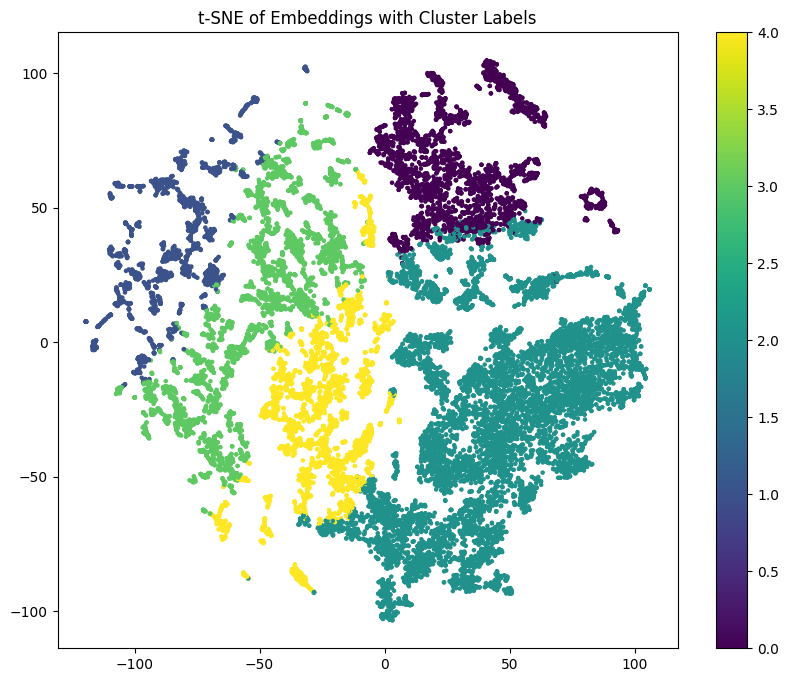

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reduce the embeddings to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Plot the clusters in 2D
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=clusters, cmap='viridis', s=5)
plt.colorbar()
plt.title('t-SNE of Embeddings with Cluster Labels')
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/tsne_clusters.png'

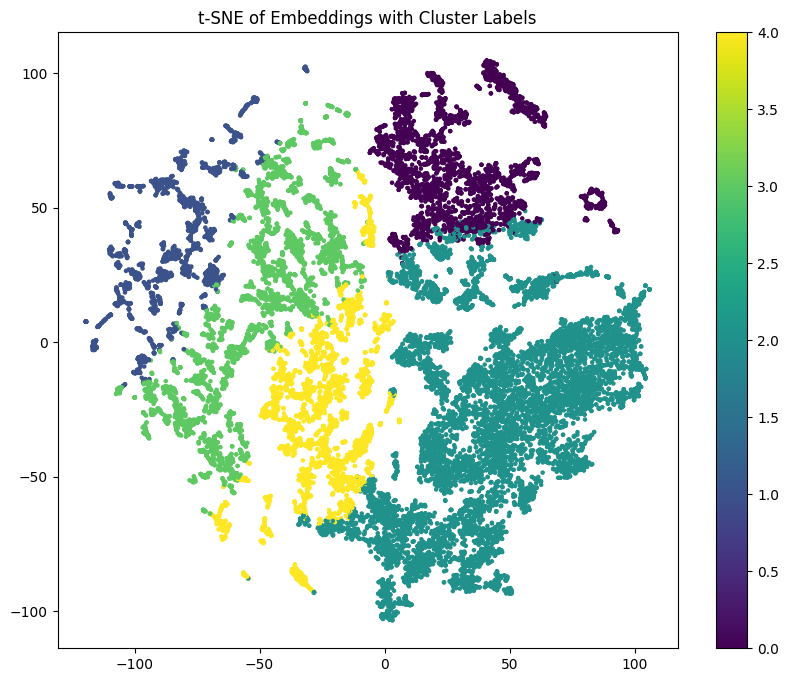

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reduce the embeddings to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Plot the clusters in 2D
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=clusters, cmap='viridis', s=5)
plt.colorbar()
plt.title('t-SNE of Embeddings with Cluster Labels')

# Save the plot as a PNG file
plt.savefig('/mnt/data/tsne_clusters.png')

# Display the plot
plt.show()


In [ ]:
import os
from collections import defaultdict

# Define the mapping between subdirectory names and cancer types
cancer_types = {
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal',
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma'
}

# Path to your image dataset
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'

# Dictionary to hold the mapping of clusters to cancer types
cluster_to_cancer = defaultdict(list)

# Helper function to list all image files in subdirectories
def list_all_images(base_folder):
    image_paths = []
    for root, dirs, files in os.walk(base_folder):
        for file in files:
            if file.endswith('.jpeg'):  # Adjust based on your image type
                image_paths.append(os.path.join(root, file))
    return image_paths

# Get the full list of image paths
all_images = list_all_images(img_folder)

# Loop through each cluster and map its images to cancer types
for cluster_number in range(5):  # Assuming 5 clusters
    cluster_indices = np.where(clusters == cluster_number)[0]

    # Go through the images in this cluster
    for idx in cluster_indices:
        # Extract the image path from the all_images list
        img_path = all_images[idx]

        # Extract the corresponding cancer type from the directory structure
        for cancer_type, label in cancer_types.items():
            if cancer_type in img_path:  # Check if the cancer type is in the image path
                cluster_to_cancer[cluster_number].append(label)

# Count the cancer types in each cluster
for cluster, labels in cluster_to_cancer.items():
    print(f"Cluster {cluster} contains:")
    label_counts = {label: labels.count(label) for label in set(labels)}
    for label, count in label_counts.items():
        print(f"  {label}: {count} images")


Cluster 0 contains:
  Lung Normal: 3564 images
  Colon Normal: 4 images
Cluster 1 contains:
  Lung Adenocarcinoma: 585 images
  Lung Squamous Cell Carcinoma: 1859 images
Cluster 2 contains:
  Lung Normal: 1161 images
  Colon Adenocarcinoma: 4133 images
  Lung Adenocarcinoma: 90 images
  Colon Normal: 4990 images
Cluster 3 contains:
  Lung Adenocarcinoma: 2628 images
  Lung Squamous Cell Carcinoma: 2056 images
Cluster 4 contains:
  Lung Adenocarcinoma: 1697 images
  Lung Normal: 275 images
  Colon Adenocarcinoma: 867 images
  Colon Normal: 6 images
  Lung Squamous Cell Carcinoma: 1085 images


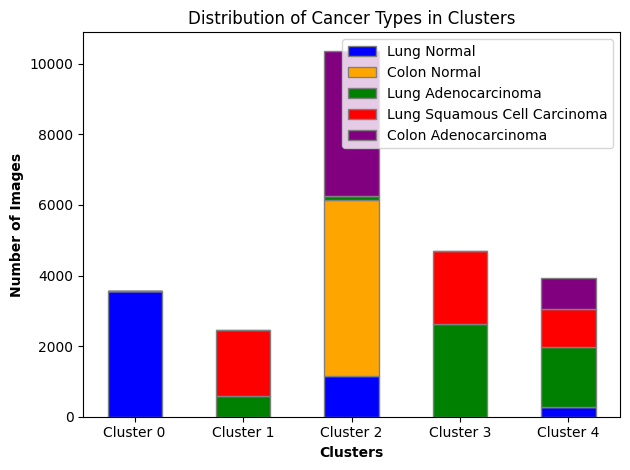

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data: Number of images in each cluster for different types
clusters = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
lung_normal = [3564, 0, 1161, 0, 275]
colon_normal = [4, 0, 4990, 0, 6]
lung_adenocarcinoma = [0, 585, 90, 2628, 1697]
lung_squamous = [0, 1859, 0, 2056, 1085]
colon_adenocarcinoma = [0, 0, 4133, 0, 867]

# Creating a stacked bar chart
barWidth = 0.5

# Define positions
r = np.arange(len(clusters))

# Plotting each part of the stack
plt.bar(r, lung_normal, color='blue', edgecolor='grey', width=barWidth, label='Lung Normal')
plt.bar(r, colon_normal, bottom=lung_normal, color='orange', edgecolor='grey', width=barWidth, label='Colon Normal')
plt.bar(r, lung_adenocarcinoma, bottom=np.array(lung_normal) + np.array(colon_normal), color='green', edgecolor='grey', width=barWidth, label='Lung Adenocarcinoma')
plt.bar(r, lung_squamous, bottom=np.array(lung_normal) + np.array(colon_normal) + np.array(lung_adenocarcinoma), color='red', edgecolor='grey', width=barWidth, label='Lung Squamous Cell Carcinoma')
plt.bar(r, colon_adenocarcinoma, bottom=np.array(lung_normal) + np.array(colon_normal) + np.array(lung_adenocarcinoma) + np.array(lung_squamous), color='purple', edgecolor='grey', width=barWidth, label='Colon Adenocarcinoma')

# Adding labels and title
plt.xlabel('Clusters', fontweight='bold')
plt.ylabel('Number of Images', fontweight='bold')
plt.xticks(r, clusters)
plt.title('Distribution of Cancer Types in Clusters')

# Add legend
plt.legend(loc='upper right')

# Display the chart
plt.tight_layout()
plt.show()


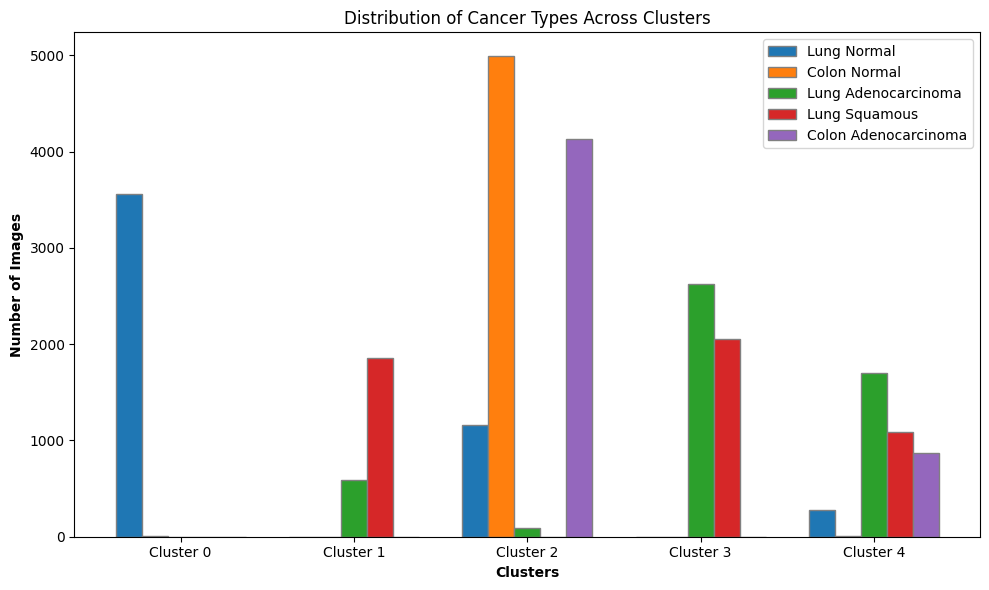

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data: Number of images in each cluster for different types
clusters = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
lung_normal = [3564, 0, 1161, 0, 275]
colon_normal = [4, 0, 4990, 0, 6]
lung_adenocarcinoma = [0, 585, 90, 2628, 1697]
lung_squamous = [0, 1859, 0, 2056, 1085]
colon_adenocarcinoma = [0, 0, 4133, 0, 867]

# Data into a list for ease of plotting
data = [lung_normal, colon_normal, lung_adenocarcinoma, lung_squamous, colon_adenocarcinoma]
labels = ['Lung Normal', 'Colon Normal', 'Lung Adenocarcinoma', 'Lung Squamous', 'Colon Adenocarcinoma']

# Number of clusters and tissue types
n_clusters = len(clusters)
n_types = len(labels)

# Define the positions for bars
r = np.arange(n_clusters)  # The positions for cluster labels on the x-axis
barWidth = 0.15  # Width of each bar
positions = [r + i*barWidth for i in range(n_types)]  # Adjusting positions for each tissue type

# Create the plot
plt.figure(figsize=(10, 6))

# Plotting each tissue type
for i in range(n_types):
    plt.bar(positions[i], data[i], width=barWidth, edgecolor='grey', label=labels[i])

# Adding labels and title
plt.xlabel('Clusters', fontweight='bold')
plt.ylabel('Number of Images', fontweight='bold')
plt.title('Distribution of Cancer Types Across Clusters')

# Adding x-axis ticks
plt.xticks([r + barWidth*2 for r in range(n_clusters)], clusters)

# Adding legend
plt.legend(loc='upper right')

# Display the plot
plt.tight_layout()
plt.show()


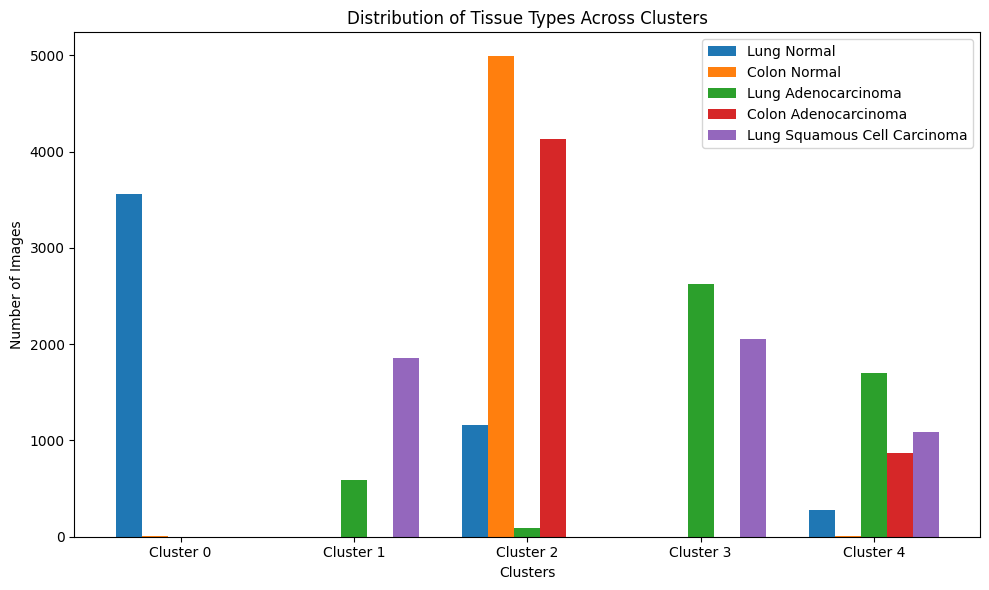

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for each cluster and tissue type
cluster_labels = ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
tissue_types = ['Lung Normal', 'Colon Normal', 'Lung Adenocarcinoma', 'Colon Adenocarcinoma', 'Lung Squamous Cell Carcinoma']

# Values (order corresponds to cluster_labels and tissue_types)
values = np.array([
    [3564, 4, 0, 0, 0],         # Cluster 0
    [0, 0, 585, 0, 1859],       # Cluster 1
    [1161, 4990, 90, 4133, 0],  # Cluster 2
    [0, 0, 2628, 0, 2056],      # Cluster 3
    [275, 6, 1697, 867, 1085]   # Cluster 4
])

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

# Bar width and positions
bar_width = 0.15
index = np.arange(len(cluster_labels))

# Plot each tissue type as a grouped bar
for i, tissue in enumerate(tissue_types):
    ax.bar(index + i * bar_width, values[:, i], bar_width, label=tissue)

# Add labels and title
ax.set_xlabel('Clusters')
ax.set_ylabel('Number of Images')
ax.set_title('Distribution of Tissue Types Across Clusters')
ax.set_xticks(index + bar_width * 2)
ax.set_xticklabels(cluster_labels)

# Add a legend
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Load the embeddings (25000, 192)
embeddings = np.load('embeddings.npy')

# Perform t-SNE to reduce embeddings to 2D
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Scatter plot of t-SNE-reduced embeddings with cluster labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=clusters, cmap='tab10', s=10, alpha=0.7)

# Add a colorbar to show the cluster labels
plt.colorbar(scatter, label='Cluster')

# Add title and labels
plt.title('t-SNE of Histopathological Image Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')

# Show plot
plt.tight_layout()
plt.show()


ValueError: Found array with dim 3. TSNE expected <= 2.

ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not ['Cluster 0', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']

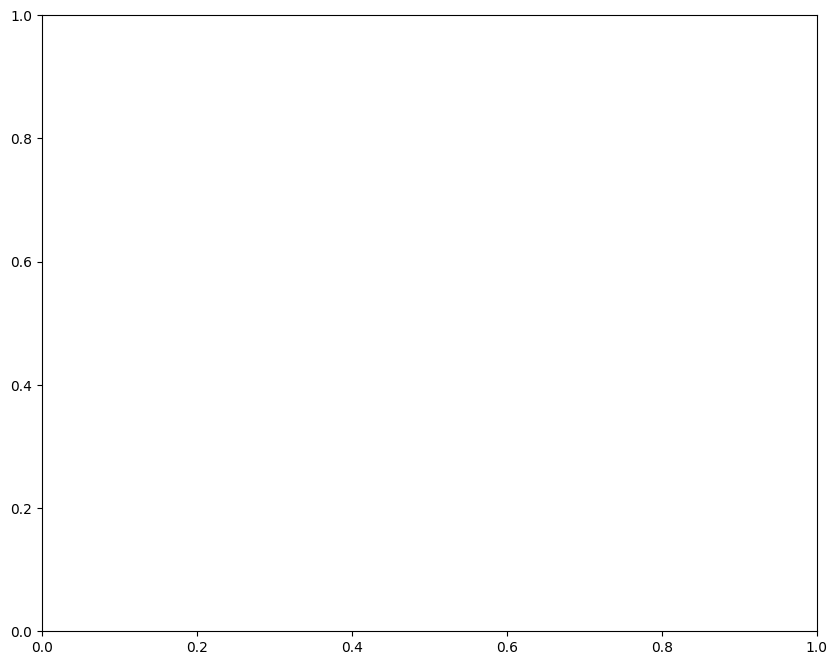

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Load the embeddings (25000, 1, 192)
embeddings = np.load('embeddings.npy')

# Remove the extra dimension (squeeze the array)
embeddings = np.squeeze(embeddings)  # Now shape will be (25000, 192)

# Perform t-SNE to reduce embeddings to 2D
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Scatter plot of t-SNE-reduced embeddings with cluster labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=clusters, cmap='tab10', s=10, alpha=0.7)

# Add a colorbar to show the cluster labels
plt.colorbar(scatter, label='Cluster')

# Add title and labels
plt.title('t-SNE of Histopathological Image Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')

# Show plot
plt.tight_layout()
plt.show()


In [ ]:
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
img_files = os.listdir(img_folder)

# Print the number of images available
print(f"Number of images in the folder: {len(img_files)}")


Number of images in the folder: 2


Total number of images: 25000


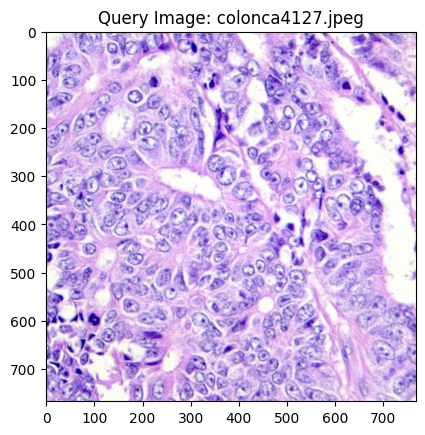

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Define the base folder and subdirectories
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
colon_img_folder = os.path.join(img_folder, 'colon_image_sets')
lung_img_folder = os.path.join(img_folder, 'lung_image_sets')

# List images from the subdirectories
colon_aca_images = os.listdir(os.path.join(colon_img_folder, 'colon_aca'))
colon_n_images = os.listdir(os.path.join(colon_img_folder, 'colon_n'))
lung_aca_images = os.listdir(os.path.join(lung_img_folder, 'lung_aca'))
lung_n_images = os.listdir(os.path.join(lung_img_folder, 'lung_n'))
lung_scc_images = os.listdir(os.path.join(lung_img_folder, 'lung_scc'))

# Combine all images into a single list
all_images = colon_aca_images + colon_n_images + lung_aca_images + lung_n_images + lung_scc_images

# Check the number of images
print(f"Total number of images: {len(all_images)}")

# Choose a query index (between 0 and total number of images - 1)
query_index = 100  # Adjust this index as needed (between 0 and len(all_images) - 1)

# Get the query image filename and path
if query_index < len(colon_aca_images):
    query_img_filename = colon_aca_images[query_index]
    query_img_path = os.path.join(colon_img_folder, 'colon_aca', query_img_filename)
elif query_index < len(colon_aca_images) + len(colon_n_images):
    query_img_filename = colon_n_images[query_index - len(colon_aca_images)]
    query_img_path = os.path.join(colon_img_folder, 'colon_n', query_img_filename)
elif query_index < len(colon_aca_images) + len(colon_n_images) + len(lung_aca_images):
    query_img_filename = lung_aca_images[query_index - len(colon_aca_images) - len(colon_n_images)]
    query_img_path = os.path.join(lung_img_folder, 'lung_aca', query_img_filename)
elif query_index < len(colon_aca_images) + len(colon_n_images) + len(lung_aca_images) + len(lung_n_images):
    query_img_filename = lung_n_images[query_index - len(colon_aca_images) - len(colon_n_images) - len(lung_aca_images)]
    query_img_path = os.path.join(lung_img_folder, 'lung_n', query_img_filename)
else:
    query_img_filename = lung_scc_images[query_index - len(colon_aca_images) - len(colon_n_images) - len(lung_aca_images) - len(lung_n_images)]
    query_img_path = os.path.join(lung_img_folder, 'lung_scc', query_img_filename)

# Load and display the query image
query_img = Image.open(query_img_path)
plt.imshow(query_img)
plt.title(f"Query Image: {query_img_filename}")
plt.show()

# Extract the query image embedding
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation


Total number of images: 25000


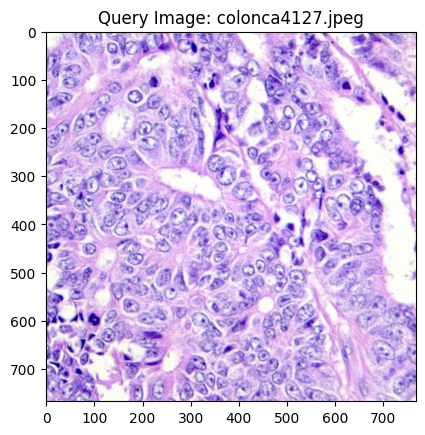

ValueError: Found array with dim 3. check_pairwise_arrays expected <= 2.

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Define the base folder and subdirectories
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
colon_img_folder = os.path.join(img_folder, 'colon_image_sets')
lung_img_folder = os.path.join(img_folder, 'lung_image_sets')

# List images from the subdirectories
colon_aca_images = os.listdir(os.path.join(colon_img_folder, 'colon_aca'))
colon_n_images = os.listdir(os.path.join(colon_img_folder, 'colon_n'))
lung_aca_images = os.listdir(os.path.join(lung_img_folder, 'lung_aca'))
lung_n_images = os.listdir(os.path.join(lung_img_folder, 'lung_n'))
lung_scc_images = os.listdir(os.path.join(lung_img_folder, 'lung_scc'))

# Combine all images into a single list
all_images = colon_aca_images + colon_n_images + lung_aca_images + lung_n_images + lung_scc_images

# Check the number of images
print(f"Total number of images: {len(all_images)}")

# Choose a query index (between 0 and total number of images - 1)
query_index = 100  # Adjust this index as needed (between 0 and len(all_images) - 1)

# Get the query image filename and path
if query_index < len(colon_aca_images):
    query_img_filename = colon_aca_images[query_index]
    query_img_path = os.path.join(colon_img_folder, 'colon_aca', query_img_filename)
elif query_index < len(colon_aca_images) + len(colon_n_images):
    query_img_filename = colon_n_images[query_index - len(colon_aca_images)]
    query_img_path = os.path.join(colon_img_folder, 'colon_n', query_img_filename)
elif query_index < len(colon_aca_images) + len(colon_n_images) + len(lung_aca_images):
    query_img_filename = lung_aca_images[query_index - len(colon_aca_images) - len(colon_n_images)]
    query_img_path = os.path.join(lung_img_folder, 'lung_aca', query_img_filename)
elif query_index < len(colon_aca_images) + len(colon_n_images) + len(lung_aca_images) + len(lung_n_images):
    query_img_filename = lung_n_images[query_index - len(colon_aca_images) - len(colon_n_images) - len(lung_aca_images)]
    query_img_path = os.path.join(lung_img_folder, 'lung_n', query_img_filename)
else:
    query_img_filename = lung_scc_images[query_index - len(colon_aca_images) - len(colon_n_images) - len(lung_aca_images) - len(lung_n_images)]
    query_img_path = os.path.join(lung_img_folder, 'lung_scc', query_img_filename)

# Load and display the query image
query_img = Image.open(query_img_path)
plt.imshow(query_img)
plt.title(f"Query Image: {query_img_filename}")
plt.show()

# Extract the query image embedding
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Adjust the number of similar images you want to display
top_indices = np.argsort(similarities[0])[-top_n:][::-1]  # Sort by similarity, descending order

# Display the top N similar images along with their similarity scores
plt.figure(figsize=(15, 10))
for i, idx in enumerate(top_indices):
    # Get the corresponding image path
    if idx < len(colon_aca_images):
        img_filename = colon_aca_images[idx]
        img_path = os.path.join(colon_img_folder, 'colon_aca', img_filename)
    elif idx < len(colon_aca_images) + len(colon_n_images):
        img_filename = colon_n_images[idx - len(colon_aca_images)]
        img_path = os.path.join(colon_img_folder, 'colon_n', img_filename)
    elif idx < len(colon_aca_images) + len(colon_n_images) + len(lung_aca_images):
        img_filename = lung_aca_images[idx - len(colon_aca_images) - len(colon_n_images)]
        img_path = os.path.join(lung_img_folder, 'lung_aca', img_filename)
    elif idx < len(colon_aca_images) + len(colon_n_images) + len(lung_aca_images) + len(lung_n_images):
        img_filename = lung_n_images[idx - len(colon_aca_images) - len(colon_n_images) - len(lung_aca_images)]
        img_path = os.path.join(lung_img_folder, 'lung_n', img_filename)
    else:
        img_filename = lung_scc_images[idx - len(colon_aca_images) - len(colon_n_images) - len(lung_aca_images) - len(lung_n_images)]
        img_path = os.path.join(lung_img_folder, 'lung_scc', img_filename)

    # Load and display the similar image
    similar_img = Image.open(img_path)
    plt.subplot(1, top_n, i+1)
    plt.imshow(similar_img)
    plt.title(f"Similarity: {similarities[0][idx]:.4f}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Extract the query image embedding
query_embedding = embeddings[query_index]  # No need for reshape here

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding.reshape(1, -1), embeddings)  # Now it will have shape (1, 25000)


ValueError: Found array with dim 3. check_pairwise_arrays expected <= 2.

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load the embeddings (shape: 25000, 1, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove the extra dimension (now it should be of shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Optionally, load the image for display
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
query_img_filename = os.listdir(img_folder)[query_index]
query_img_path = os.path.join(img_folder, query_img_filename)
query_img = Image.open(query_img_path)

# Display the query image
plt.imshow(query_img)
plt.title("Query Image")
plt.show()

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images (e.g., top 5)
top_n = 5
top_n_indices = similarities[0].argsort()[-top_n:][::-1]

# Display the top N most similar images and their similarity scores
for i, idx in enumerate(top_n_indices):
    similar_img_filename = os.listdir(img_folder)[idx]
    similar_img_path = os.path.join(img_folder, similar_img_filename)
    similar_img = Image.open(similar_img_path)

    # Display the similar image
    plt.imshow(similar_img)
    plt.title(f"Similarity {similarities[0][idx]:.4f} - Image {idx}")
    plt.show()


IndexError: list index out of range

Total number of images: 25000


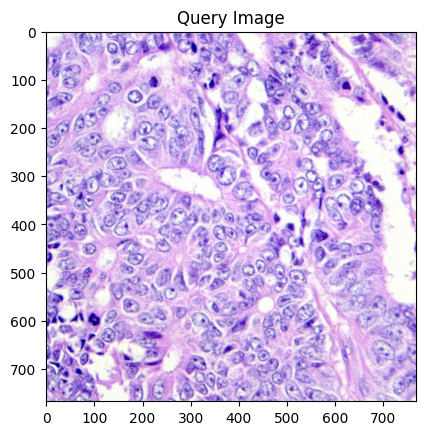

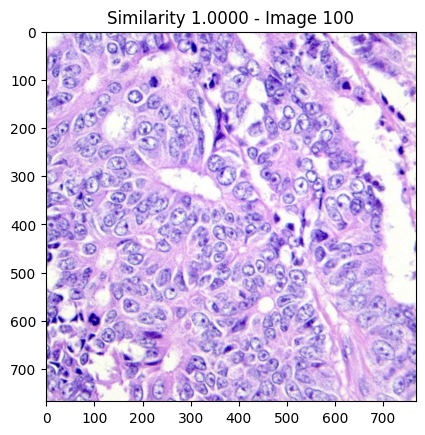

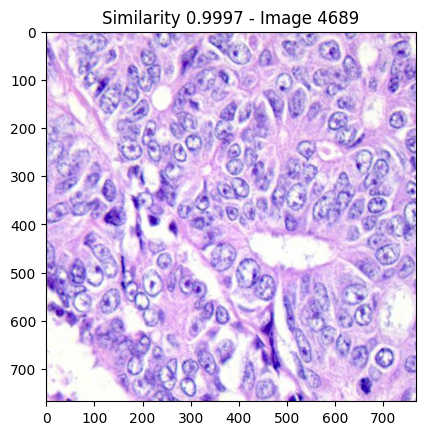

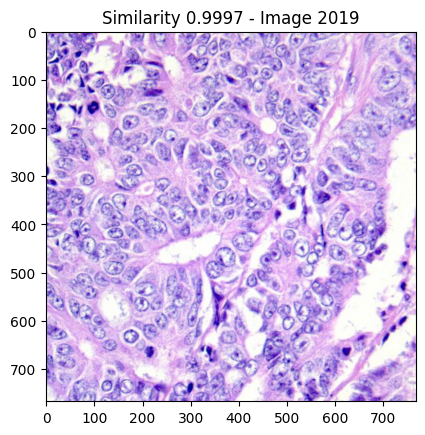

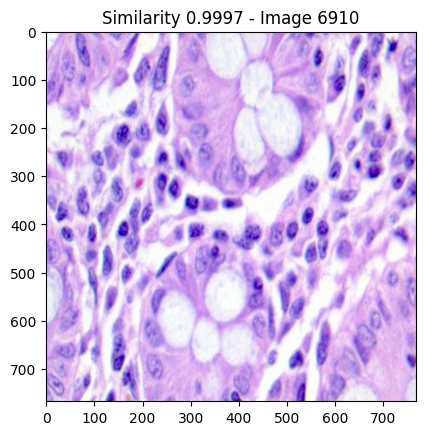

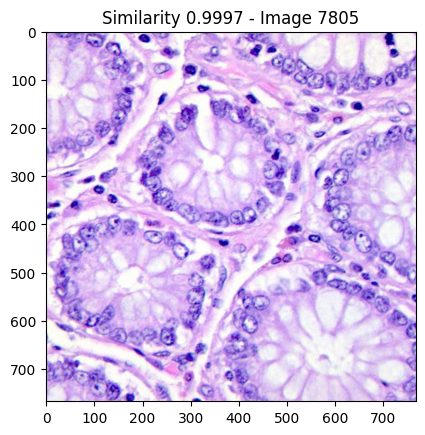

In [ ]:
import os
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove the extra dimension (now it should be of shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Traverse the directories and collect all image file paths
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Collect paths for all images in the subfolders (colon_image_sets, lung_image_sets)
for root, dirs, files in os.walk(img_folder):
    for file in files:
        if file.endswith('.jpeg'):  # Assuming images are .jpeg
            image_paths.append(os.path.join(root, file))

# Total number of images
total_images = len(image_paths)
print(f"Total number of images: {total_images}")

# Choose a query image (example index, you can change it)
query_index = 100  # Change this to any index between 0 and total_images - 1
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Load the query image for display
query_img_path = image_paths[query_index]
query_img = Image.open(query_img_path)

# Display the query image
plt.imshow(query_img)
plt.title("Query Image")
plt.show()

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images (e.g., top 5)
top_n = 5
top_n_indices = similarities[0].argsort()[-top_n:][::-1]

# Display the top N most similar images and their similarity scores
for i, idx in enumerate(top_n_indices):
    similar_img_path = image_paths[idx]
    similar_img = Image.open(similar_img_path)

    # Display the similar image
    plt.imshow(similar_img)
    plt.title(f"Similarity {similarities[0][idx]:.4f} - Image {idx}")
    plt.show()


Total number of images: 25000


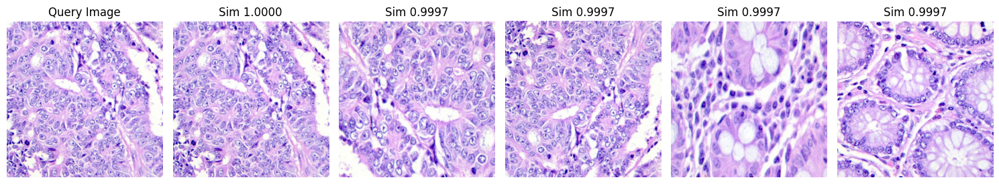

In [ ]:
import os
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove the extra dimension (now it should be of shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Traverse the directories and collect all image file paths
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Collect paths for all images in the subfolders (colon_image_sets, lung_image_sets)
for root, dirs, files in os.walk(img_folder):
    for file in files:
        if file.endswith('.jpeg'):  # Assuming images are .jpeg
            image_paths.append(os.path.join(root, file))

# Total number of images
total_images = len(image_paths)
print(f"Total number of images: {total_images}")

# Choose a query image (example index, you can change it)
query_index = 100  # Change this to any index between 0 and total_images - 1
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Load the query image for display
query_img_path = image_paths[query_index]
query_img = Image.open(query_img_path)

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images (e.g., top 5)
top_n = 5
top_n_indices = similarities[0].argsort()[-top_n:][::-1]

# Create a single figure to display all images
fig, axes = plt.subplots(1, top_n + 1, figsize=(15, 5))

# Display the query image in the first subplot
axes[0].imshow(query_img)
axes[0].set_title("Query Image")
axes[0].axis('off')

# Display the top N most similar images in subsequent subplots
for i, idx in enumerate(top_n_indices):
    similar_img_path = image_paths[idx]
    similar_img = Image.open(similar_img_path)

    axes[i+1].imshow(similar_img)
    axes[i+1].set_title(f"Sim {similarities[0][idx]:.4f}")
    axes[i+1].axis('off')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


Total number of images: 25000


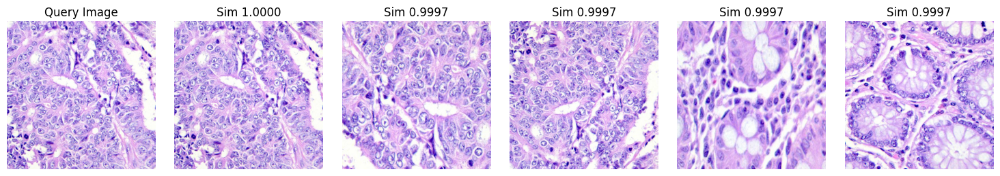

In [ ]:
import os
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from PIL import Image

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove the extra dimension (now it should be of shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Traverse the directories and collect all image file paths
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Collect paths for all images in the subfolders (colon_image_sets, lung_image_sets)
for root, dirs, files in os.walk(img_folder):
    for file in files:
        if file.endswith('.jpeg'):  # Assuming images are .jpeg
            image_paths.append(os.path.join(root, file))

# Total number of images
total_images = len(image_paths)
print(f"Total number of images: {total_images}")

# Choose a query image (example index, you can change it)
query_index = 100  # Change this to any index between 0 and total_images - 1
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Load the query image for display
query_img_path = image_paths[query_index]
query_img = Image.open(query_img_path)

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images (e.g., top 5)
top_n = 5
top_n_indices = similarities[0].argsort()[-top_n:][::-1]

# Create a single figure to display all images
fig, axes = plt.subplots(1, top_n + 1, figsize=(15, 5))

# Display the query image in the first subplot
axes[0].imshow(query_img)
axes[0].set_title("Query Image")
axes[0].axis('off')

# Display the top N most similar images in subsequent subplots
for i, idx in enumerate(top_n_indices):
    similar_img_path = image_paths[idx]
    similar_img = Image.open(similar_img_path)

    axes[i+1].imshow(similar_img)
    axes[i+1].set_title(f"Sim {similarities[0][idx]:.4f}")
    axes[i+1].axis('off')

# Adjust layout for better spacing and alignment
plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.05)  # Adjust subplot spacing
plt.tight_layout(pad=2.0)  # Increase padding between images

# Show the plot
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import os
from PIL import Image

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Number of similar images to retrieve
top_indices = similarities[0].argsort()[-top_n:][::-1]

# Get the folder structure
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
folders = {
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma',
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal'
}

# Find the folder names for the top N similar images
top_labels = []
for idx in top_indices:
    # Get the image's folder (based on index in img_folder)
    img_filename = os.listdir(img_folder)[idx]
    for folder, cancer_type in folders.items():
        if folder in img_filename:  # Check if the image filename contains the cancer type folder name
            top_labels.append(cancer_type)
            break

# Output the cancer types of the top N similar images
print(f"Query image cancer type: {folders[folders.keys()[query_index % len(folders)]]}")
print(f"Top {top_n} similar images and their cancer types: {top_labels}")


ValueError: Found array with dim 3. check_pairwise_arrays expected <= 2.

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import os
from PIL import Image

# Load the embeddings (shape: 25000, 1, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove extra dimensions (shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Number of similar images to retrieve
top_indices = similarities[0].argsort()[-top_n:][::-1]

# Get the folder structure
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
folders = {
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma',
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal'
}

# Find the folder names for the top N similar images
top_labels = []
for idx in top_indices:
    # Get the image's folder (based on index in img_folder)
    img_filename = os.listdir(img_folder)[idx]
    for folder, cancer_type in folders.items():
        if folder in img_filename:  # Check if the image filename contains the cancer type folder name
            top_labels.append(cancer_type)
            break

# Output the cancer types of the top N similar images
print(f"Query image cancer type: {folders[folders.keys()[query_index % len(folders)]]}")
print(f"Top {top_n} similar images and their cancer types: {top_labels}")


IndexError: list index out of range

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import os
from PIL import Image

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove extra dimensions (shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Number of similar images to retrieve
top_indices = similarities[0].argsort()[-top_n:][::-1]

# Get all image paths across subdirectories
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Function to recursively find all image paths
def get_image_paths(directory):
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpeg'):
                image_paths.append(os.path.join(subdir, file))

# Collect image paths
get_image_paths(img_folder)

# Find the cancer type associated with each image in the top N similar images
top_labels = []
for idx in top_indices:
    img_filename = image_paths[idx]
    # Check the folder name in the path to determine cancer type
    for folder, cancer_type in folders.items():
        if folder in img_filename:
            top_labels.append(cancer_type)
            break

# Output the cancer types of the top N similar images
folders = {
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma',
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal'
}

# Get the cancer type of the query image
query_img_path = image_paths[query_index]
for folder, cancer_type in folders.items():
    if folder in query_img_path:
        query_label = cancer_type
        break

print(f"Query image cancer type: {query_label}")
print(f"Top {top_n} similar images and their cancer types: {top_labels}")


Query image cancer type: Colon Adenocarcinoma
Top 5 similar images and their cancer types: ['Colon Adenocarcinoma', 'Colon Adenocarcinoma', 'Colon Adenocarcinoma', 'Colon Normal', 'Colon Normal']


In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import os
from PIL import Image

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove extra dimensions (shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Number of similar images to retrieve
top_indices = similarities[0].argsort()[-top_n:][::-1]

# Get all image paths across subdirectories
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Function to recursively find all image paths
def get_image_paths(directory):
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpeg'):
                image_paths.append(os.path.join(subdir, file))

# Collect image paths
get_image_paths(img_folder)

# Find the cancer type associated with each image in the top N similar images
top_labels = []
top_similarities = []  # To store similarity scores

folders = {
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma',
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal'
}

# Get the cancer type of the query image
query_img_path = image_paths[query_index]
for folder, cancer_type in folders.items():
    if folder in query_img_path:
        query_label = cancer_type
        break

print(f"Query image cancer type: {query_label}")

# Loop through top indices and extract similarity scores and cancer types
for idx in top_indices:
    img_filename = image_paths[idx]
    # Extract similarity score
    similarity_score = similarities[0][idx]
    top_similarities.append(similarity_score)

    # Check the folder name in the path to determine cancer type
    for folder, cancer_type in folders.items():
        if folder in img_filename:
            top_labels.append(cancer_type)
            break

# Output the similarity results with cancer types
print(f"\nTop {top_n} similar images and their similarity scores and cancer types:")
for i in range(top_n):
    print(f"Image {i + 1}: Similarity Score = {top_similarities[i]:.4f}, Cancer Type = {top_labels[i]}")


Query image cancer type: Colon Adenocarcinoma

Top 5 similar images and their similarity scores and cancer types:
Image 1: Similarity Score = 1.0000, Cancer Type = Colon Adenocarcinoma
Image 2: Similarity Score = 0.9997, Cancer Type = Colon Adenocarcinoma
Image 3: Similarity Score = 0.9997, Cancer Type = Colon Adenocarcinoma
Image 4: Similarity Score = 0.9997, Cancer Type = Colon Normal
Image 5: Similarity Score = 0.9997, Cancer Type = Colon Normal


Query image cancer type: Colon Adenocarcinoma

Top 5 similar images and their similarity scores and cancer types:
Image 1: Similarity Score = 1.0000, Cancer Type = Colon Adenocarcinoma
Image 2: Similarity Score = 0.9997, Cancer Type = Colon Adenocarcinoma
Image 3: Similarity Score = 0.9997, Cancer Type = Colon Adenocarcinoma
Image 4: Similarity Score = 0.9997, Cancer Type = Colon Normal
Image 5: Similarity Score = 0.9997, Cancer Type = Colon Normal


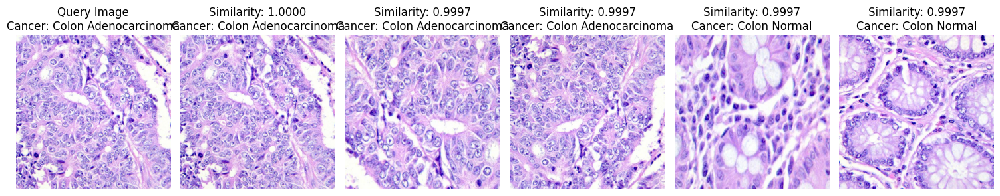

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from sklearn.metrics.pairwise import cosine_similarity

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove extra dimensions (shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Number of similar images to retrieve
top_indices = similarities[0].argsort()[-top_n:][::-1]

# Get all image paths across subdirectories
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Function to recursively find all image paths
def get_image_paths(directory):
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpeg'):
                image_paths.append(os.path.join(subdir, file))

# Collect image paths
get_image_paths(img_folder)

# Find the cancer type associated with each image in the top N similar images
top_labels = []
top_similarities = []  # To store similarity scores
query_label = None  # Placeholder for query label

# Define the cancer type based on folder names
folders = {
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma',
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal'
}

# Get the cancer type of the query image
query_img_path = image_paths[query_index]
for folder, cancer_type in folders.items():
    if folder in query_img_path:
        query_label = cancer_type
        break

print(f"Query image cancer type: {query_label}")

# Loop through top indices and extract similarity scores and cancer types
for idx in top_indices:
    img_filename = image_paths[idx]
    # Extract similarity score
    similarity_score = similarities[0][idx]
    top_similarities.append(similarity_score)

    # Check the folder name in the path to determine cancer type
    for folder, cancer_type in folders.items():
        if folder in img_filename:
            top_labels.append(cancer_type)
            break

# Output the similarity results with cancer types
print(f"\nTop {top_n} similar images and their similarity scores and cancer types:")
for i in range(top_n):
    print(f"Image {i + 1}: Similarity Score = {top_similarities[i]:.4f}, Cancer Type = {top_labels[i]}")

# Now, let's display the images and their similarity scores in a plot

fig, axes = plt.subplots(1, top_n + 1, figsize=(15, 5))

# Display the query image
query_img = Image.open(query_img_path)
axes[0].imshow(query_img)
axes[0].set_title(f"Query Image\nCancer: {query_label}")
axes[0].axis('off')

# Display the top N similar images
for i, idx in enumerate(top_indices):
    img_path = image_paths[idx]
    img = Image.open(img_path)
    axes[i + 1].imshow(img)
    axes[i + 1].set_title(f"Similarity: {top_similarities[i]:.4f}\nCancer: {top_labels[i]}")
    axes[i + 1].axis('off')

plt.tight_layout()
plt.show()


Query image cancer type: Colon Adenocarcinoma

Top 5 similar images and their similarity scores and cancer types:
Image 1: Similarity Score = 1.0000, Cancer Type = Colon Adenocarcinoma
Image 2: Similarity Score = 0.9997, Cancer Type = Colon Adenocarcinoma
Image 3: Similarity Score = 0.9997, Cancer Type = Colon Adenocarcinoma
Image 4: Similarity Score = 0.9997, Cancer Type = Colon Normal
Image 5: Similarity Score = 0.9997, Cancer Type = Colon Normal


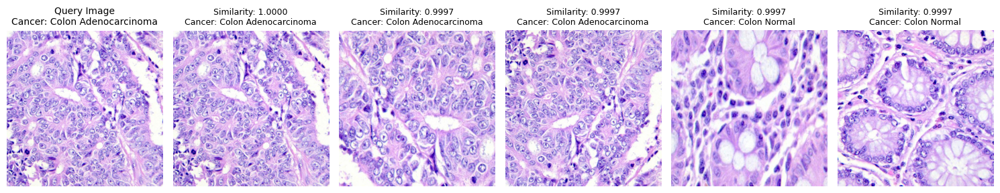

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from sklearn.metrics.pairwise import cosine_similarity

# Load the embeddings (shape: 25000, 192)
embeddings = np.load('embeddings.npy')

# Squeeze the embeddings to remove extra dimensions (shape: 25000, 192)
embeddings = np.squeeze(embeddings)

# Choose a query image (example index, you can change it)
query_index = 100  # You can choose any image index here (between 0 and 24999)
query_embedding = embeddings[query_index].reshape(1, -1)  # Reshape to (1, 192) for similarity calculation

# Calculate cosine similarity between the query image and all other images
similarities = cosine_similarity(query_embedding, embeddings)  # Shape: (1, 25000)

# Get the indices of the top N most similar images
top_n = 5  # Number of similar images to retrieve
top_indices = similarities[0].argsort()[-top_n:][::-1]

# Get all image paths across subdirectories
img_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
image_paths = []

# Function to recursively find all image paths
def get_image_paths(directory):
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpeg'):
                image_paths.append(os.path.join(subdir, file))

# Collect image paths
get_image_paths(img_folder)

# Find the cancer type associated with each image in the top N similar images
top_labels = []
top_similarities = []  # To store similarity scores
query_label = None  # Placeholder for query label

# Define the cancer type based on folder names
folders = {
    'lung_aca': 'Lung Adenocarcinoma',
    'lung_n': 'Lung Normal',
    'lung_scc': 'Lung Squamous Cell Carcinoma',
    'colon_aca': 'Colon Adenocarcinoma',
    'colon_n': 'Colon Normal'
}

# Get the cancer type of the query image
query_img_path = image_paths[query_index]
for folder, cancer_type in folders.items():
    if folder in query_img_path:
        query_label = cancer_type
        break

print(f"Query image cancer type: {query_label}")

# Loop through top indices and extract similarity scores and cancer types
for idx in top_indices:
    img_filename = image_paths[idx]
    # Extract similarity score
    similarity_score = similarities[0][idx]
    top_similarities.append(similarity_score)

    # Check the folder name in the path to determine cancer type
    for folder, cancer_type in folders.items():
        if folder in img_filename:
            top_labels.append(cancer_type)
            break

# Output the similarity results with cancer types
print(f"\nTop {top_n} similar images and their similarity scores and cancer types:")
for i in range(top_n):
    print(f"Image {i + 1}: Similarity Score = {top_similarities[i]:.4f}, Cancer Type = {top_labels[i]}")

# Now, let's display the images and their similarity scores in a plot

fig, axes = plt.subplots(1, top_n + 1, figsize=(15, 5))

# Display the query image
query_img = Image.open(query_img_path)
axes[0].imshow(query_img)
axes[0].set_title(f"Query Image\nCancer: {query_label}", fontsize=10)
axes[0].axis('off')

# Display the top N similar images
for i, idx in enumerate(top_indices):
    img_path = image_paths[idx]
    img = Image.open(img_path)
    axes[i + 1].imshow(img)
    axes[i + 1].set_title(f"Similarity: {top_similarities[i]:.4f}\nCancer: {top_labels[i]}", fontsize=9)
    axes[i + 1].axis('off')

# Adjust layout to prevent label overlap
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming embeddings (25000, 192) and labels (25000,) are already available
# labels should be the true labels for the cancer types of each image

# Example labels array (replace this with your actual labels)
# labels = np.array([...])  # labels corresponding to the cancer type for each image

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(embeddings, labels, test_size=0.2, random_state=42)

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Generate classification report
report = classification_report(y_test, y_pred, target_names=np.unique(labels))
print(report)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(labels), yticklabels=np.unique(labels))
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


ValueError: Found input variables with inconsistent numbers of samples: [25000, 5]

In [ ]:
import os
import numpy as np

# Folder structure based on cancer types
base_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
subfolders = {
    'Colon Adenocarcinoma': 'colon_image_sets/colon_aca',
    'Colon Normal': 'colon_image_sets/colon_n',
    'Lung Adenocarcinoma': 'lung_image_sets/lung_aca',
    'Lung Normal': 'lung_image_sets/lung_n',
    'Lung Squamous Cell Carcinoma': 'lung_image_sets/lung_scc'
}

# Initialize an empty list for labels
labels = []

# Go through the folders and assign labels based on the folder names
for cancer_type, folder in subfolders.items():
    folder_path = os.path.join(base_folder, folder)
    for img_file in os.listdir(folder_path):
        labels.append(cancer_type)

# Convert labels list to a numpy array
labels = np.array(labels)

# Check if the number of labels matches the number of embeddings
assert len(labels) == len(embeddings), f"Number of labels ({len(labels)}) does not match number of embeddings ({len(embeddings)})"


In [ ]:
import os
import numpy as np

# Folder structure based on cancer types
base_folder = '/content/Lung and colon cancer histopathological images/lung_colon_image_set'
subfolders = {
    'Colon Adenocarcinoma': 'colon_image_sets/colon_aca',
    'Colon Normal': 'colon_image_sets/colon_n',
    'Lung Adenocarcinoma': 'lung_image_sets/lung_aca',
    'Lung Normal': 'lung_image_sets/lung_n',
    'Lung Squamous Cell Carcinoma': 'lung_image_sets/lung_scc'
}

# Initialize an empty list for labels
labels = []

# Go through the folders and assign labels based on the folder names
for cancer_type, folder in subfolders.items():
    folder_path = os.path.join(base_folder, folder)
    for img_file in os.listdir(folder_path):
        labels.append(cancer_type)

# Convert labels list to a numpy array
labels = np.array(labels)

# Check if the number of labels matches the number of embeddings
assert len(labels) == len(embeddings), f"Number of labels ({len(labels)}) does not match number of embeddings ({len(embeddings)})"


Accuracy: 92.64%
                              precision    recall  f1-score   support

        Colon Adenocarcinoma       0.93      0.86      0.89      1021
                Colon Normal       0.87      0.94      0.91      1000
         Lung Adenocarcinoma       0.94      0.92      0.93       985
                 Lung Normal       0.90      0.93      0.92       989
Lung Squamous Cell Carcinoma       1.00      0.99      0.99      1005

                    accuracy                           0.93      5000
                   macro avg       0.93      0.93      0.93      5000
                weighted avg       0.93      0.93      0.93      5000



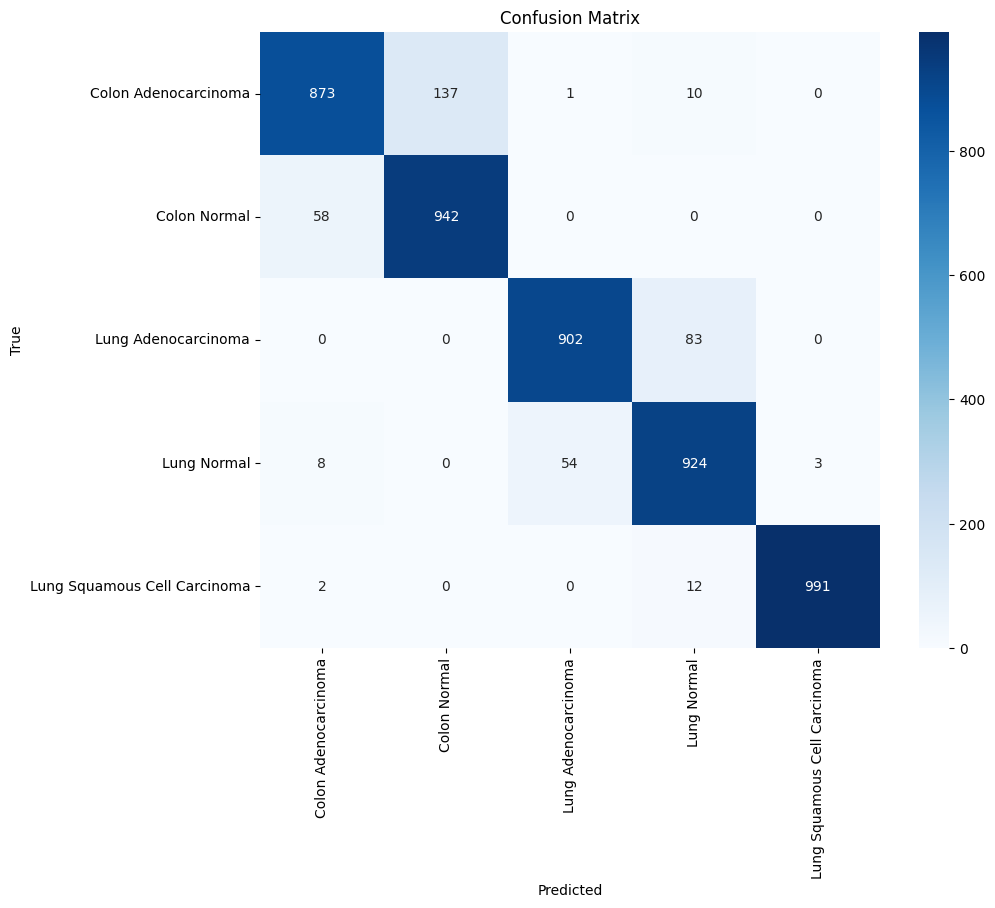

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming embeddings (25000, 192) and labels (25000,) are already available
# labels should be the true labels for the cancer types of each image

# Example labels array (replace this with your actual labels)
# labels = np.array([...])  # labels corresponding to the cancer type for each image

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(embeddings, labels, test_size=0.2, random_state=42)

# Train a Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Generate classification report
report = classification_report(y_test, y_pred, target_names=np.unique(labels))
print(report)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(labels), yticklabels=np.unique(labels))
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


Validation Accuracy: 92.44%
Validation Classification Report:
                               precision    recall  f1-score   support

        Colon Adenocarcinoma       0.92      0.85      0.88       999
                Colon Normal       0.88      0.94      0.91      1041
         Lung Adenocarcinoma       0.93      0.93      0.93      1025
                 Lung Normal       0.90      0.92      0.91       978
Lung Squamous Cell Carcinoma       1.00      0.99      0.99       957

                    accuracy                           0.92      5000
                   macro avg       0.93      0.92      0.92      5000
                weighted avg       0.93      0.92      0.92      5000

Test Accuracy: 91.94%
Test Classification Report:
                               precision    recall  f1-score   support

        Colon Adenocarcinoma       0.91      0.85      0.88       989
                Colon Normal       0.87      0.93      0.90       973
         Lung Adenocarcinoma       0.92   

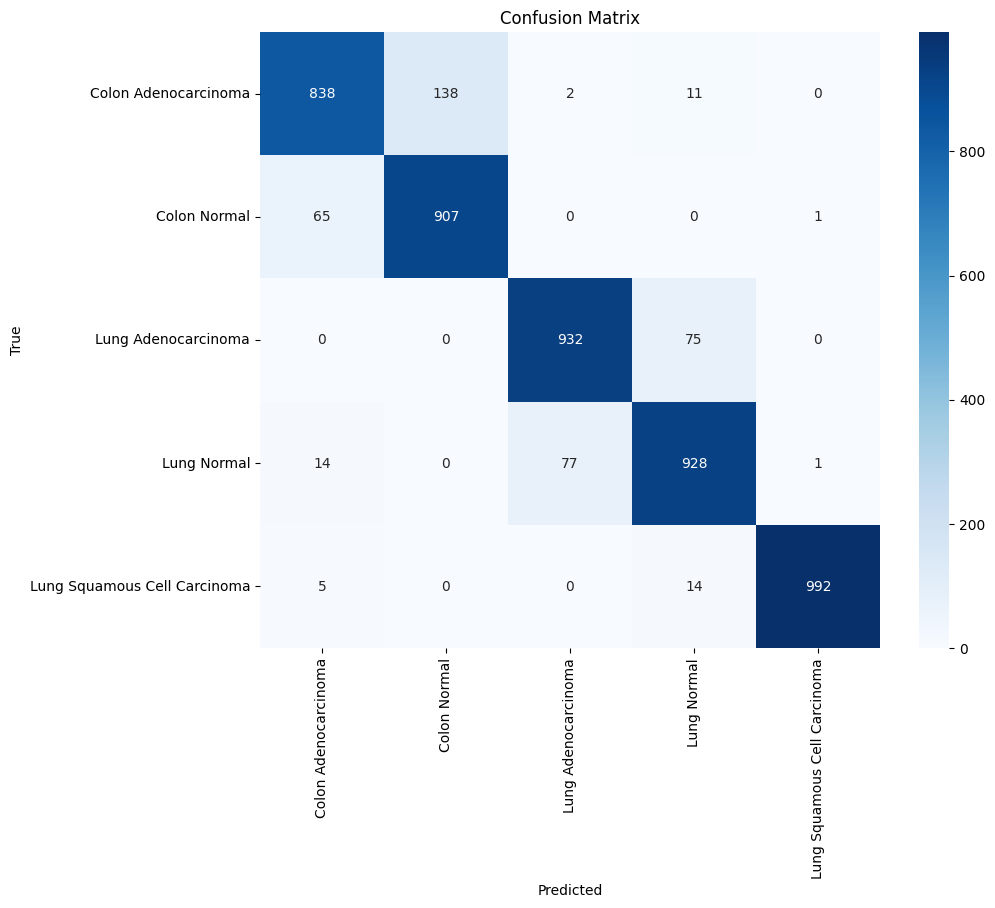

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming embeddings (25000, 192) and labels (25000,) are already available
# labels should be the true labels for the cancer types of each image

# Step 1: Split the data into training (60%) and temporary (40%) sets
X_train, X_temp, y_train, y_temp = train_test_split(embeddings, labels, test_size=0.4, random_state=42)

# Step 2: Split the temporary set into validation (50% of temp = 20% overall) and test (50% of temp = 20% overall)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Step 3: Train a Random Forest classifier on the training data
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Step 4: Make predictions on the validation set
y_val_pred = clf.predict(X_val)

# Step 5: Calculate validation accuracy
val_accuracy = accuracy_score(y_val, y_val_pred)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

# Step 6: Generate classification report for the validation set
val_report = classification_report(y_val, y_val_pred, target_names=np.unique(labels))
print("Validation Classification Report:\n", val_report)

# Step 7: Make predictions on the test set
y_test_pred = clf.predict(X_test)

# Step 8: Calculate test accuracy
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

# Step 9: Generate classification report for the test set
test_report = classification_report(y_test, y_test_pred, target_names=np.unique(labels))
print("Test Classification Report:\n", test_report)

# Step 10: Confusion matrix for the test set
cm = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(labels), yticklabels=np.unique(labels))
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


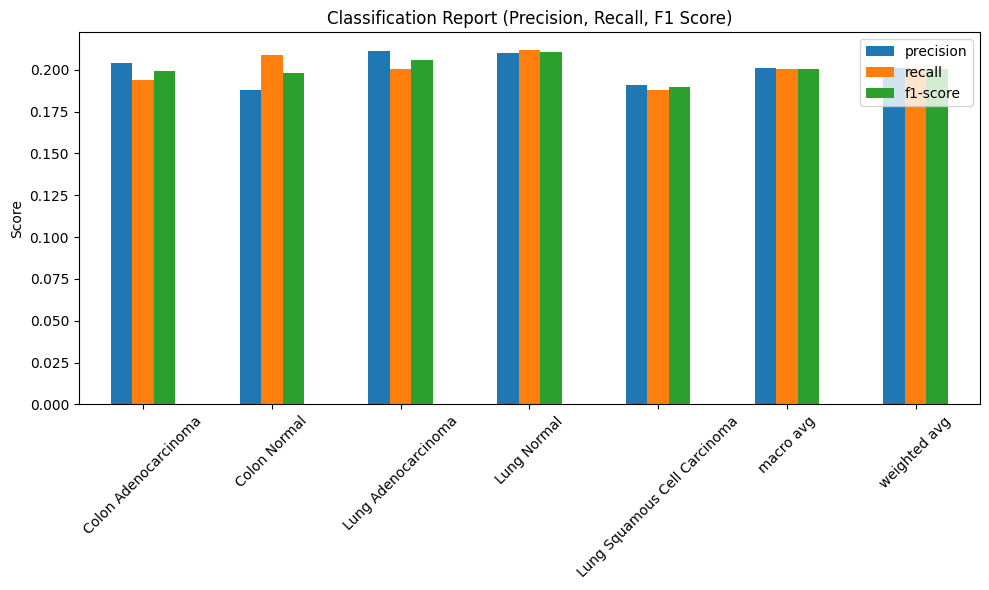

In [ ]:
from sklearn.metrics import classification_report
import pandas as pd
import matplotlib.pyplot as plt

# Get classification report
report = classification_report(y_test, y_pred, target_names=np.unique(labels), output_dict=True)
report_df = pd.DataFrame(report).transpose()

# Check if 'accuracy' is present in the dataframe, and if so, drop it
if 'accuracy' in report_df.index:
    report_df.drop('accuracy', axis=0, inplace=True)

# Plot precision, recall, and F1 scores
fig, ax = plt.subplots(figsize=(10, 6))
report_df.drop('support', axis=1).plot(kind='bar', ax=ax)  # Removing support column
plt.title('Classification Report (Precision, Recall, F1 Score)')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


ValueError: 'c' argument must be a color, a sequence of colors, or a sequence of numbers, not array(['Colon Adenocarcinoma', 'Colon Adenocarcinoma',
       'Colon Adenocarcinoma', ..., 'Lung Squamous Cell Carcinoma',
       'Lung Squamous Cell Carcinoma', 'Lung Squamous Cell Carcinoma'],
      dtype='<U28')

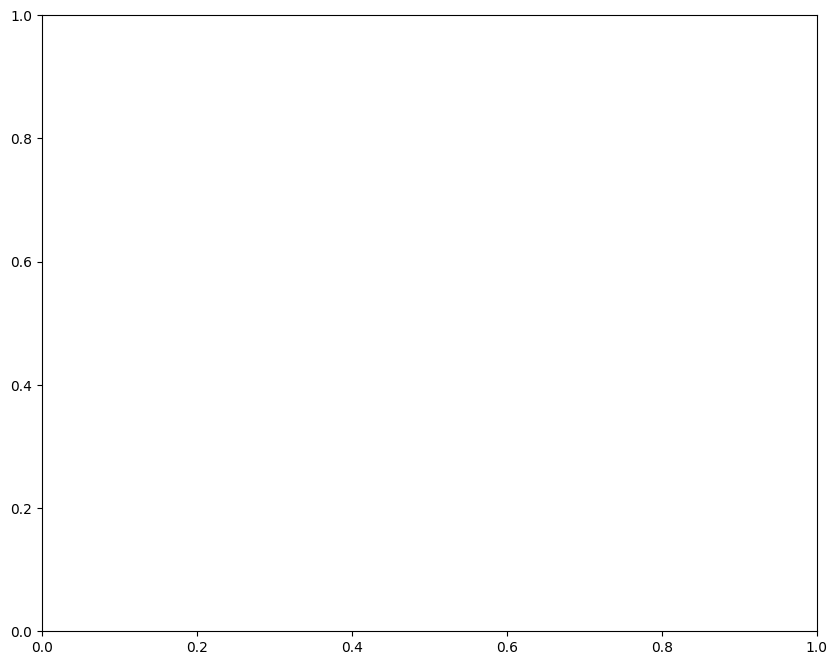

In [ ]:
from sklearn.manifold import TSNE

# Perform t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Create a scatter plot to show how images are clustered
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=labels, cmap='tab10', s=10, alpha=0.7)
plt.title('t-SNE of Image Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.colorbar(label='Cancer Types')
plt.tight_layout()
plt.show()


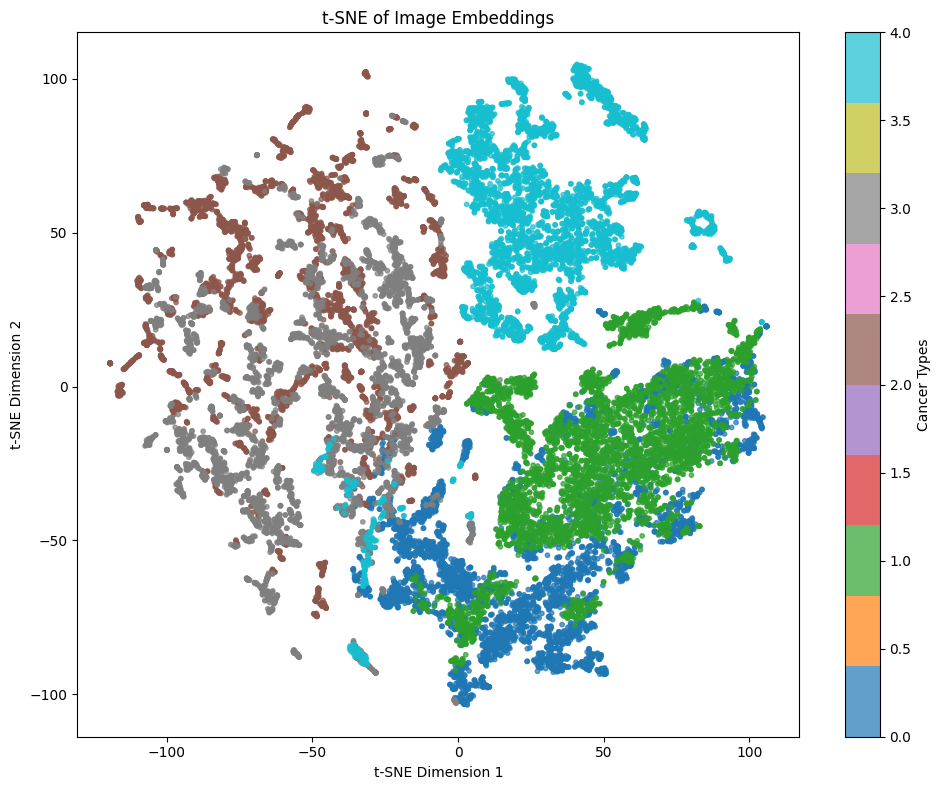

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Encode the labels into numeric values
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Perform t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Create a scatter plot to show how images are clustered
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=encoded_labels, cmap='tab10', s=10, alpha=0.7)
plt.title('t-SNE of Image Embeddings')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.colorbar(label='Cancer Types')
plt.tight_layout()
plt.show()


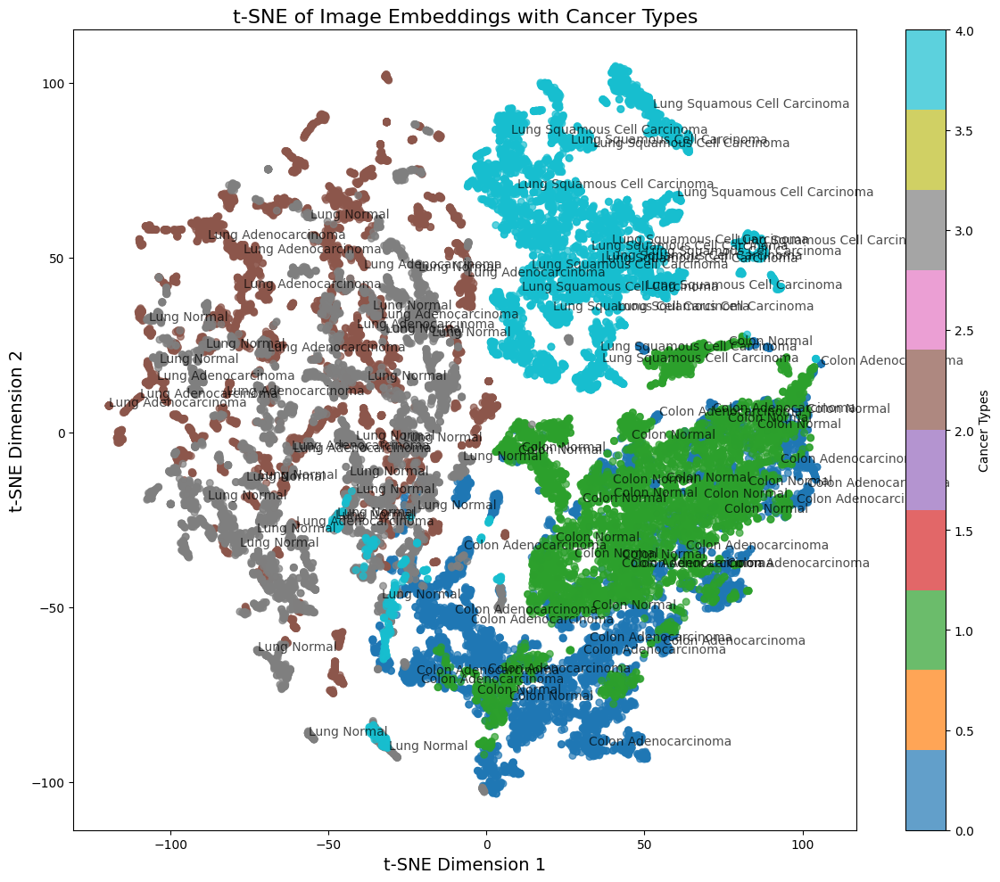

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Encode the labels into numeric values
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)

# Perform t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(embeddings)

# Create a scatter plot to show how images are clustered
plt.figure(figsize=(12, 10))

# Scatter plot
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c=encoded_labels, cmap='tab10', s=30, alpha=0.7)

# Reduce the number of annotations for readability (optional)
sample_size = 100  # Show only a subset of points for clarity
sample_indices = np.random.choice(len(embeddings_2d), size=sample_size, replace=False)

# Annotate a subset of points with its corresponding cancer type
for i in sample_indices:
    plt.text(embeddings_2d[i, 0], embeddings_2d[i, 1], labels[i], fontsize=10, alpha=0.7)

# Add a colorbar to indicate the cancer types
plt.colorbar(scatter, label='Cancer Types')

# Add plot title and labels
plt.title('t-SNE of Image Embeddings with Cancer Types', fontsize=16)
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd

# Assuming 'labels' is a list of the true cancer types for each image
# 'cluster_labels' contains the cluster number for each image (from 0 to 4)

# Create a DataFrame to hold the cluster number and the actual cancer type
data = pd.DataFrame({'Cluster': cluster_labels, 'Cancer Type': labels})

# Count the number of images in each cluster for each cancer type
cluster_composition = data.groupby(['Cluster', 'Cancer Type']).size().unstack(fill_value=0)

# Display the composition of each cluster
print(cluster_composition)

# Optionally, you can name the clusters based on the majority cancer type in each cluster
dominant_cancer_type = cluster_composition.idxmax(axis=1)
print("Dominant cancer type in each cluster:")
print(dominant_cancer_type)


NameError: name 'cluster_labels' is not defined

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans

# Assuming 'embeddings' is a numpy array with shape (25000, 192)
# 'labels' is a list or array of the actual cancer types for each image

# Run KMeans clustering on the embeddings
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(embeddings)  # Cluster assignments for each image

# Create a DataFrame to hold the cluster number and the actual cancer type
data = pd.DataFrame({'Cluster': cluster_labels, 'Cancer Type': labels})

# Count the number of images in each cluster for each cancer type
cluster_composition = data.groupby(['Cluster', 'Cancer Type']).size().unstack(fill_value=0)

# Display the composition of each cluster
print(cluster_composition)

# Find the dominant cancer type in each cluster
dominant_cancer_type = cluster_composition.idxmax(axis=1)
print("Dominant cancer type in each cluster:")
print(dominant_cancer_type)

# Optionally, plot the distribution of cancer types within each cluster
cluster_composition.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='tab20')
plt.title('Cancer Type Distribution Across Clusters')
plt.xlabel('Cluster')
plt.ylabel('Number of Images')
plt.legend(title='Cancer Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


NameError: name 'embeddings' is not defined